# 3. Markov Chain Monte Carlo Methods

* 소비자On : 파트 5 - 베이지안 마케팅 [1]
* 김무성

# Contents
* Using this Chapter
* 3.1 MARKOV CHAIN MONTE CARLO METHODS
* 3.2 A SIMPLE EXAMPLE: BIVARIATE NORMAL GIBBS SAMPLER
* 3.3 SOME MARKOV CHAIN THEORY
* 3.4 GIBBS SAMPLER
* 3.5 GIBBS SAMPLER FOR THE SEEMINGLY UNRELATED REGRESSION MODEL
* 3.6 CONDITIONAL DISTRIBUTIONS AND DIRECTED GRAPHS
* 3.7 HIERARCHICAL LINEAR MODELS
* 3.8 DATA AUGMENTATION AND A PROBIT EXAMPLE
* 3.9 MIXTURES OF NORMALS
    - 3.9.1 Identification in Normal Mixtures
    - 3.9.2 Performance of the Unconstrained Gibbs Sampler
* 3.10 METROPOLIS ALGORITHMS
    - 3.10.1 Independence Metropolis Chains
    - 3.10.2 Random-Walk Metropolis Chains
    - 3.10.3 Scaling of the Random-Walk Metropolis
* 3.11 METROPOLIS ALGORITHMS ILLUSTRATED WITH THE MULTINOMIAL LOGIT MODEL
* 3.12 HYBRID MARKOV CHAIN MONTE CARLO METHODS
* 3.13 DIAGNOSTICS

# Using this Chapter

* This chapter provides an introduction to Markov chain Monte Carlo (MCMC) methods and provides detailed discussion of the MCMC methods that have proved especially useful for marketing and micro-econometric problems. 
* In addition, several key examples are developed which help set the stage for more complicated models covered in later chapters.

* In many cases, the posterior distribution is represented by an unnormalized density, π∗(θ), and the problem is to construct simulation-based estimates of various aspects of this distribution. 

# 3.1 MARKOV CHAIN MONTE CARLO METHODS

#### 참고
* [2] http://www.slideshare.net/TomaszKusmierczyk/sampling-and-markov-chain-monte-carlo-techniques

<img src="http://i.stack.imgur.com/e9xI1.gif" />

<img src="http://bit-player.org/wp-content/extras/markov/art/weather-model.png" width=600 />

<img src="http://www.juergenwiki.de/work/wiki/lib/exe/fetch.php?w=500&tok=f4ed3e&media=public:murray_mlss2009talk_mcmc_21.png" width=600 />

* The idea behind MCMC methods is to formulate a Markov chain on the parameter space. If care is taken to ensure that this chain has π(•) as its equilibrium or ‘long-run’ distribution, then the chain can be used to construct simulation-based estimates of the required integrals.

* A Markov chain specifies a method for generating a sequence of random variables {θ1 , θ2 , . . . , θr , . . .} starting from initial point θ0 . This sequence is created by specifying a way of transitioning or moving from θr to θr+1. Since we are dealing with random variables, this transition process is specified by choosing the conditional distribution, θr+1|θr, or θr+1|θr ∼ F(θr). 

* This conditional distribution can be discrete, continuous, or a mixture of discrete and continuous distributions.

* By iterating the conditional distribution forward we construct a joint distribution on the sequence. The fact that this conditional distribution only depends on the last θ (or that θr completely summarizes all information up to this point) is the Markov property which greatly simplifies simulation and analysis of the chain.

####  To simulate from the Markov chain, do the following:

<img src="figures/cap3.1.png" />

#### stationary, invariant, equilibrium distribution

Under some conditions on the conditional distribution F, the distribution of θr|θ0 will converge to a fixed and unique distribution as r goes to infinity. This distribution is called the stationary, invariant, or equilibrium distribution.

If we can construct a Markov chain with stationary distribution π(•) and the conditions for convergence are met, then <font color="red">we can use the Markov chain method to construct a simulation method for estimating the posterior expectation of any function</font>:

<img src="figures/cap3.2.png" width=600 />

#### ergodic

Use of (3.1.1) is asymptotic in the sense that we are relying on the fact that <font color="red">averages of the Markov chain converge (again under some conditions) to the expectation under the stationary distribution</font> :

<img src="figures/cap3.3.png" width=600 />

If a Markov chain satisfies (3.1.2), it is called ergodic.

#### burn-in

* As a practical matter, we will be using large but finite R. Although the theory does not require it, most practitioners will discard some set of initial draws out of concern for the effects of the ‘initial condition’ or value of θ0. This is sometimes called the ‘burn-in’ period. 
* The idea is that it will take a while for the chain to ‘equilibrate’ or shrug off the effects of the initial condition.

If we ‘burn in’ for B draws, then the MCMC estimate is given by

<img src="figures/cap3.4.png" width=600 />

#### The law of large numbers

* Of course, this is an example of a Monte Carlo integration estimate. The difference now is that the draw sequence is not an iid draw sequence. <font color="red">Since we are allowed to condition on the last value in generating the next value in a Markov chain, the draws can be dependent. To some, this dependence is unfamiliar and troublesome</font>.
* <font color="blue">We are relying on something like the law of large numbers to ensure that the sample average converges to the ‘population’ average</font>. Most standard versions of the law of large numbers assume independence. As long as the dependence is not pathologi- cally strong, then the intuition behind the law of large numbers still goes through.
* The practical problem is that these simulation-based estimates may have large sampling errors.
* <font color="red">We are relying on asymptotic theory to justify our use of simulation methods with large samples</font>.
* In particular, we can increase the sample size as necessary and, for most problems, we can generate truly <font color="red">huge simulation samples at moderate computational cost</font>. 
* This means that the practical use of MCMC methods comes much closer to the long-run sampling experiments envisaged by the inventors of asymptotic theory than the usual application of these methods to small and fixed size samples.


The purpose of this introductory section was to give the reader an overview of the basic idea behind MCMC methods. We are a long way from practical application in the sense that we need to provide:

<img src="figures/cap3.5.png" width=600 />

<img src="http://images.slideplayer.com/16/5090074/slides/slide_10.jpg" width=600 />

<img src="http://image.slidesharecdn.com/markov-140514102809-phpapp02/95/hidden-markov-models-5-638.jpg?cb=1400063601" width=600 />

# 3.2 A SIMPLE EXAMPLE: BIVARIATE NORMAL GIBBS SAMPLER

#### 참고
* [4] https://theclevermachine.wordpress.com/2012/11/05/mcmc-the-gibbs-sampler/
* [5] http://web.stanford.edu/class/stats366/Gibbs.html

<img src="http://dnene.bitbucket.org/docs/mlclass-notes/_images/multivariate_gaussian_distribution_2.png" width=600 />

The ideas introduced in Section 3.1 can be better understood by considering one of the most useful and well-used MCMC methods, the Gibbs sampler.

Consider the problem of simulating from the bivariate normal distribution

<img src="figures/cap3.6.png" width=600 />

In Section 2.11.3 the standard method for drawing from the multivariate normal distribution was presented. Recall that we only have to compute the Cholesky root of the covariance matrix and use this to induce the proper level of correlation. Let Z be an R × 2 matrix of iid N (0,1) draws; then we simply compute

<img src="figures/cap3.7.png" width=600 />

The R × 2 matrix 􏰞 is a matrix whose rows are iid draws from (3.2.1).

At point θr = ( θr1 θr2 )′ (here θri is the rth draw of component i), the next random variables (θr+1,1 θr+1,2)′ are constructed by drawing from the two conditional distributions associated with the
bivariate normal,

<img src="figures/cap3.8.png" width=600 />

BIVARIATE NORMAL GIBBS SAMPLER (example)

<img src="figures/cap3.9.png" width=600 />

<img src="figures/cap3.10.png" width=600 />

<img src="figures/cap3.11.png" width=600 />

In [2]:
rbvn<-function (n, rho) 
{
        x <- rnorm(n, 0, 1)
        y <- rnorm(n, rho * x, sqrt(1 - rho^2))
        cbind(x, y)
}

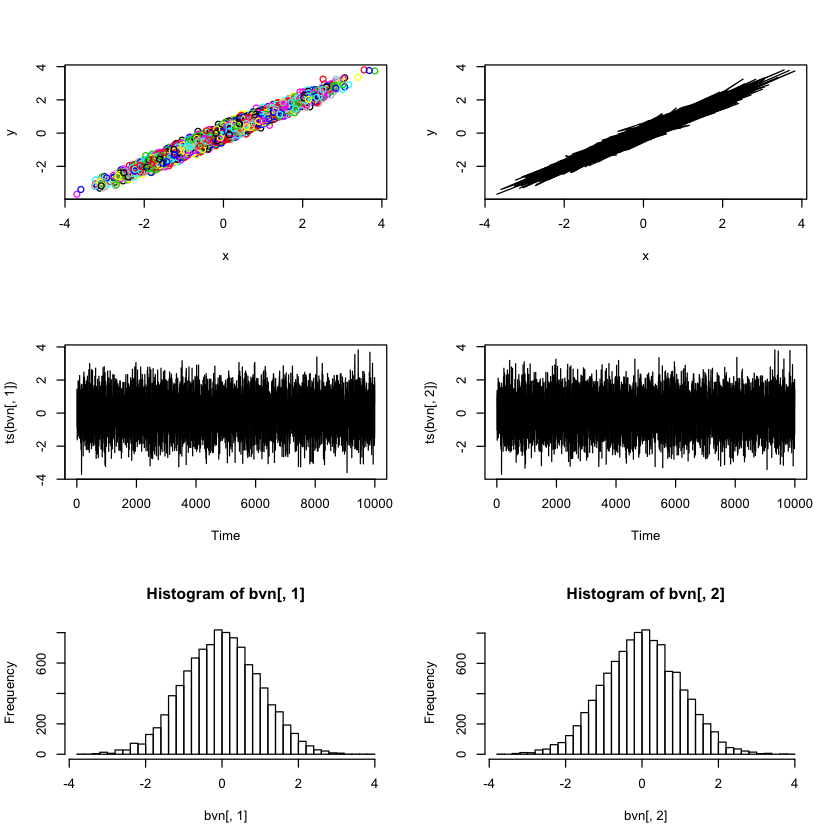

In [4]:
par(mfrow=c(3,2))
plot(bvn,col=1:10000)
plot(bvn,type="l")
plot(ts(bvn[,1]))
plot(ts(bvn[,2]))
hist(bvn[,1],40)
hist(bvn[,2],40)
par(mfrow=c(1,1))

In [5]:
gibbs<-function (n, rho) 
{
        mat <- matrix(ncol = 2, nrow = n)
        x <- 0
        y <- 0
        mat[1, ] <- c(x, y)
        for (i in 2:n) {
                x <- rnorm(1, rho * y, sqrt(1 - rho^2))
                y <- rnorm(1, rho * x, sqrt(1 - rho^2))
                mat[i, ] <- c(x, y)
        }
        mat
}

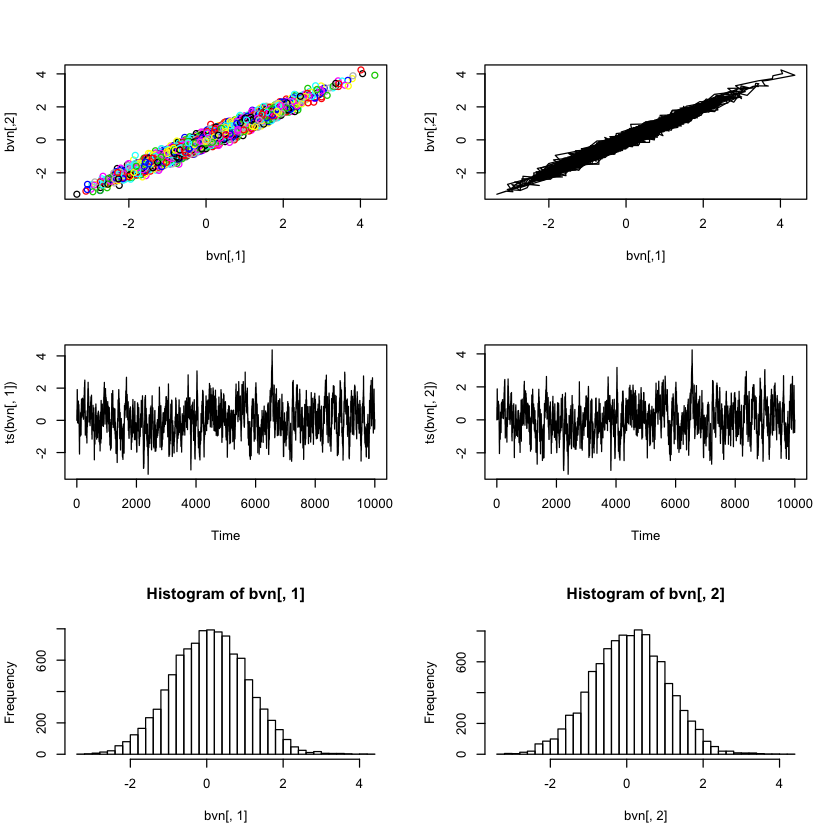

In [6]:
bvn<-gibbs(10000,0.98)
par(mfrow=c(3,2))
plot(bvn,col=1:10000)
plot(bvn,type="l")
plot(ts(bvn[,1]))
plot(ts(bvn[,2]))
hist(bvn[,1],40)
hist(bvn[,2],40)
par(mfrow=c(1,1))

<img src="figures/cap3.12.png" width=600 />

<img src="figures/cap3.13.png" width=600 />

<img src="figures/cap3.14.png" width=600 />

# 3.3 SOME MARKOV CHAIN THEORY

<img src="figures/cap3.15.png" width=600 />

<img src="figures/cap3.16.png" width=600 />

<img src="figures/cap3.17.png" width=600 />

<img src="figures/cap3.18.png" width=600 />

<img src="figures/cap3.19.png" width=600 />

<img src="figures/cap3.20.png" width=600 />

<img src="figures/cap3.21.png" width=600 />

<img src="figures/cap3.22.png" width=600 />

<img src="figures/cap3.23.png" width=600 />

<img src="figures/cap3.24.png" width=600 />

<img src="figures/cap3.25.png"  />

<img src="figures/cap3.26.png" width=600 />

<img src="figures/cap3.27.png" width=600 />

<img src="figures/cap3.28.png" width=600 />

<img src="figures/cap3.29.png" width=600 />

<img src="figures/cap3.30.png" width=600 />

# 3.4 GIBBS SAMPLER

<img src="figures/cap3.31.png" width=600 />

<img src="figures/cap3.32.png" width=600 />

<img src="figures/cap3.33.png" width=600 />

# 3.5 GIBBS SAMPLER FOR THE SEEMINGLY UNRELATED REGRESSION MODEL

# 3.6 CONDITIONAL DISTRIBUTIONS AND DIRECTED GRAPHS

# 3.7 HIERARCHICAL LINEAR MODELS

# 3.8 DATA AUGMENTATION AND A PROBIT EXAMPLE

# 3.9 MIXTURES OF NORMALS
* 3.9.1 Identification in Normal Mixtures
* 3.9.2 Performance of the Unconstrained Gibbs Sampler

## 3.9.1 Identification in Normal Mixtures

## 3.9.2 Performance of the Unconstrained Gibbs Sampler

# 3.10 METROPOLIS ALGORITHMS
* 3.10.1 Independence Metropolis Chains
* 3.10.2 Random-Walk Metropolis Chains
* 3.10.3 Scaling of the Random-Walk Metropolis

## 3.10.1 Independence Metropolis Chains

## 3.10.2 Random-Walk Metropolis Chains

## 3.10.3 Scaling of the Random-Walk Metropolis

# 3.11 METROPOLIS ALGORITHMS ILLUSTRATED WITH THE MULTINOMIAL LOGIT MODEL

# 3.12 HYBRID MARKOV CHAIN MONTE CARLO METHODS

# 3.13 DIAGNOSTICS

# 참고자료
* [1]
* [2] http://www.slideshare.net/TomaszKusmierczyk/sampling-and-markov-chain-monte-carlo-techniques
* [3] http://www.slideshare.net/dariodigiuni/markov-chain-monte-carlo-explained